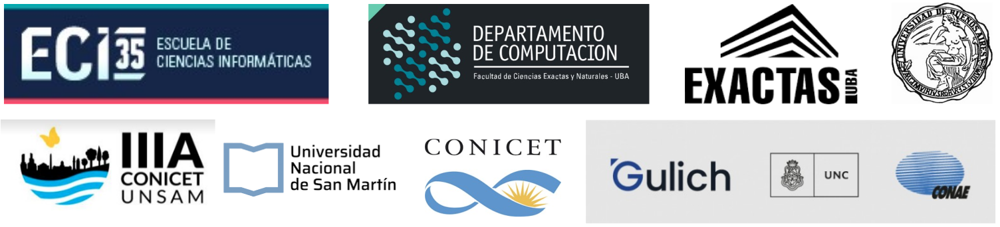
# Escuela de Ciencias Informáticas - 2022 - DC - FCEN - UBA
## Curso: Procesamiento de Imágenes Satelitales.  Docente: Rafael Grimson


---
#  Notebook 5: Datos vectoriales. Geopandas
---
Lo que veremos en esta notebook:

- [x] Datos vectoriales: puntos, lineas y polígonos. Concepto de escala.
- [x] Geopandas
- [x] Intro a QGIS
- [x] Formatos de archivos
- [x] Tablas externas. Joins
---


### Objetivos de la notebook:

- En esta notebook esperamos que comprendas los modelos de datos vectoriales como se utilizan en SIG y su manipulación desde python por medio de la biblioteca geopandas.

### Datos con los que trabajaremos en esta Notebook:

- Capa vectorial de radios censales correspondiente al Censo Nacional de Población y Vivienda 2010.  
- Tablas con datos censales correspondiente al mismo Censo.

## 1. Datos vectoriales
---
### 1.1 Puntos, líneas y polígonos

Los datos vectoriales proporcionan una forma de representar entidades del mundo real dentro del marco de sistemas de información geográfica. Un ejemplo de objeto espacial que se puede representar es cualquier objeto que se pueda ver en el paisaje: árboles, postes eléctricos, caminos, rutas, ríos,  terrenos, etc. Cada una de estos objetos pueden ser representados en el modelo vectorial de datos. Los objetos espaciales vectoriales tienen atributos, que consisten en texto o información numérica que describen los objetos espaciales.

Una entidad vectorial tiene su forma representada usando un atributo llamado geometría. La geometría está formada por una lista de uno o más vértices. Un vértice describe una posición en el espacio utilizando un eje X, Y y opcionalmente Z (en algún sistema de coordenadas preestablecido).

Cuando la geometría de un objeto espacial consta de un solo vértice, se denomina **punto**. Cuando la geometría consta de una lista de dos o más vértices y el primer y último vértice no son iguales, se denomina **polilínea**. Cuando hay tres o más vértices es posible formar un **polígono**. Esto se indica repitiendo el primer vértice la lista en el último lugar.

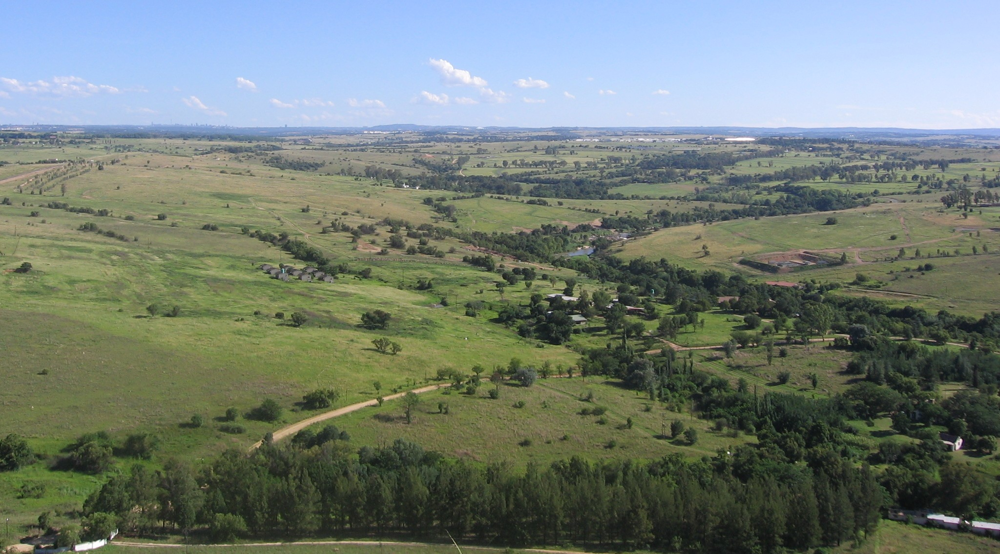

### Punto
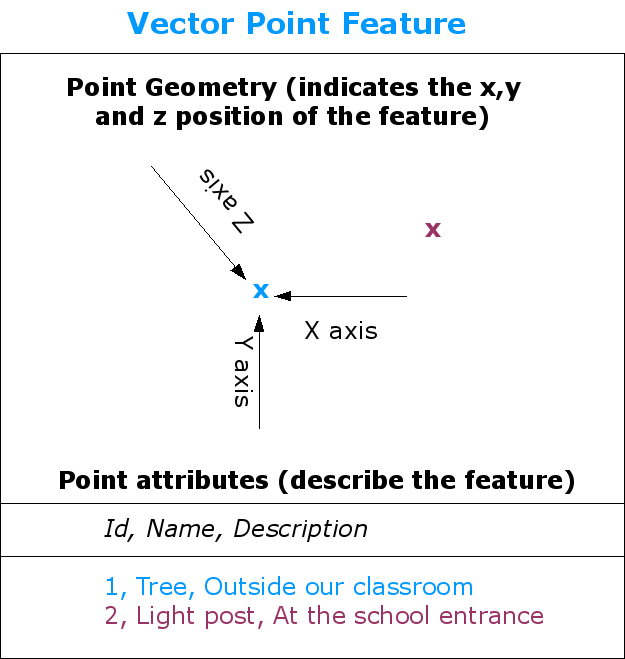

### Linea
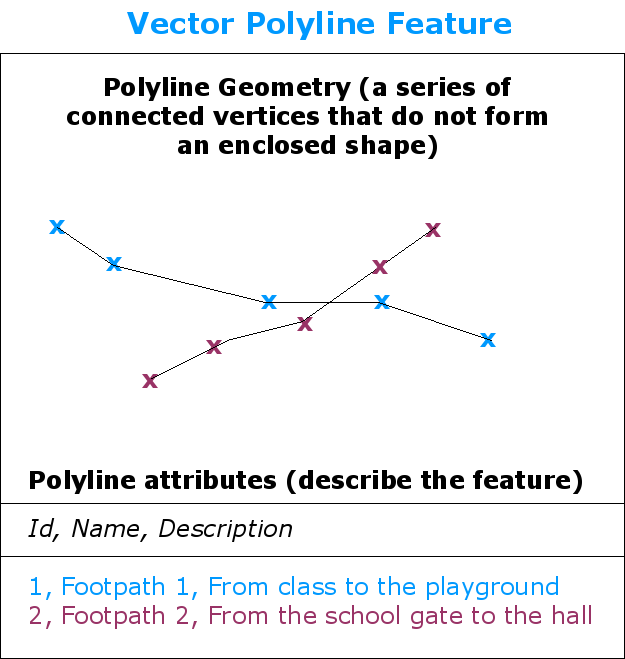

### Polígono
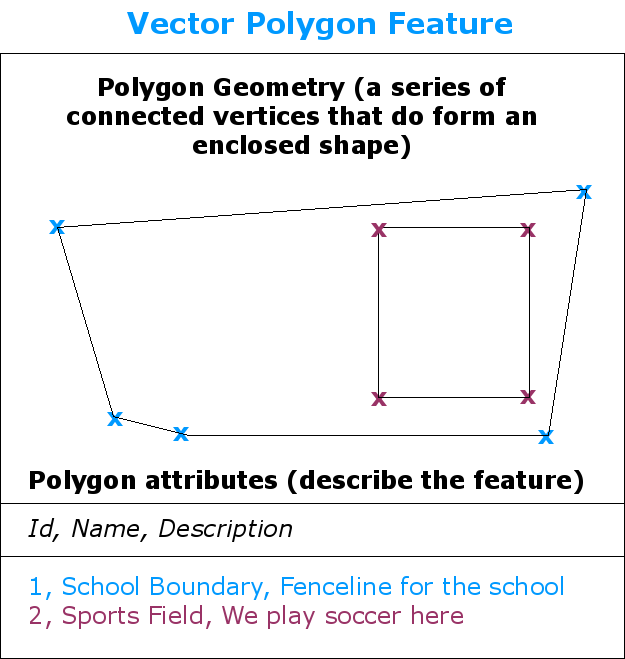

### En el paisaje
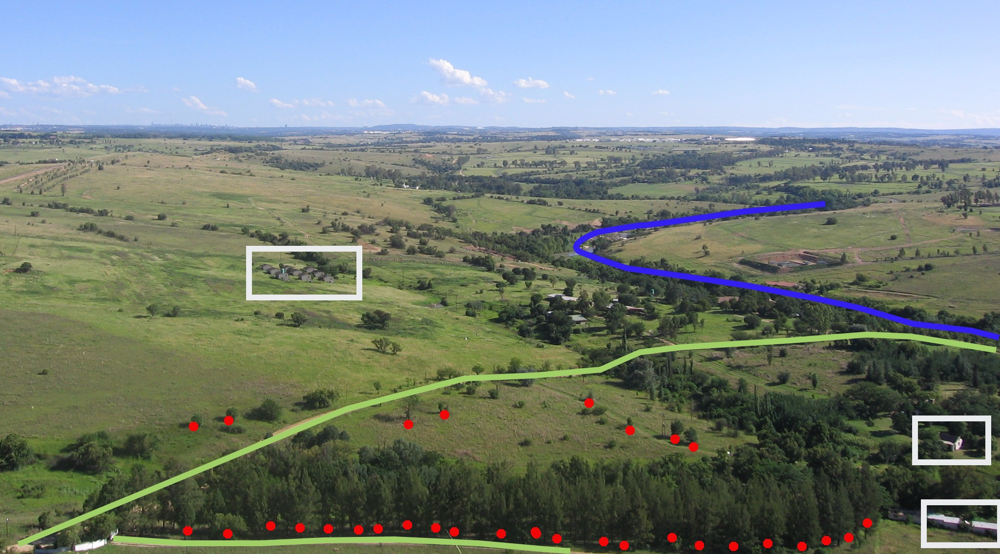

Ver más info en [el manual de QGIS](https://docs.qgis.org/3.22/es/docs/gentle_gis_introduction/vector_data.html).


---
### 1.1 El concepto de escala

En una imágen satelital, raster, tenemos su resolución espacial que nos limita la escala a la que podemos ver ese raster. La información vectorial también tiene una escala adecuada, pero el concepto no es tan inmediato.

Antes de la digitalización de la información, la escala de un mapa o de una carta en papel estaba estrechamente relacionada con la relación entre las medidas en el papel y en la realidad. Así, un mapa a escala 1:100000 representaba en un milímetro lo que en la realidad medía cien mil milímetros (es decir, cien metros). Todos los mapas tienen errores, pero un mapa bien hecho tiene errores de la misma magnitud que nuestra capacidad de percibirlos.

A partir de la digitalización de la información, esta definición de escala que relaciona lo que se mide en el mapa con lo que se mide en el territorio perdió sentido, ya que tenemos la posibilidad de hacer zoom indefinidamente. Sin embargo, los datos vectoriales siguen siendo confeccionados a cierta escala. 

**¿Qué significa la escala en datos digitales?** La escala significa que si esos datos son rendereados a la escala adecuada, los errores de georreferenciación de la información serán casi imperceptibles para el ojo humano (menos de dos décimas de milímetro). Sin embargo, al visualizarlos a mayor escala, severos errores pueden percibirse.

Si aceptamos la cota de dos décimas de milímetro como error, podemos decir que un dato confeccionado a escala 1:50000 debe tener en el terreno un error menor que 10 metros, mientras que un dato confeccionado a escala 1:1000000 puede tener hasta 200 metros de error.

### Datos confeccionados a escala 1:1.000.000
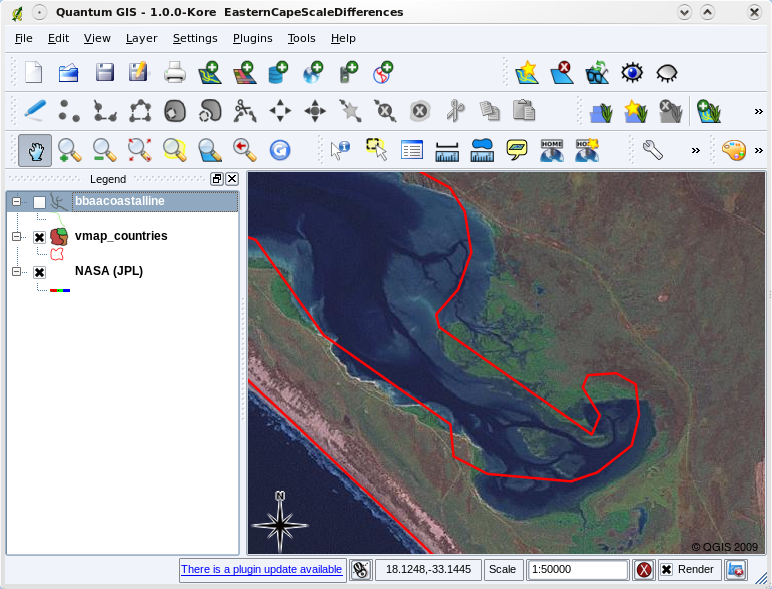

### Datos confeccionados a escala 1:50.000
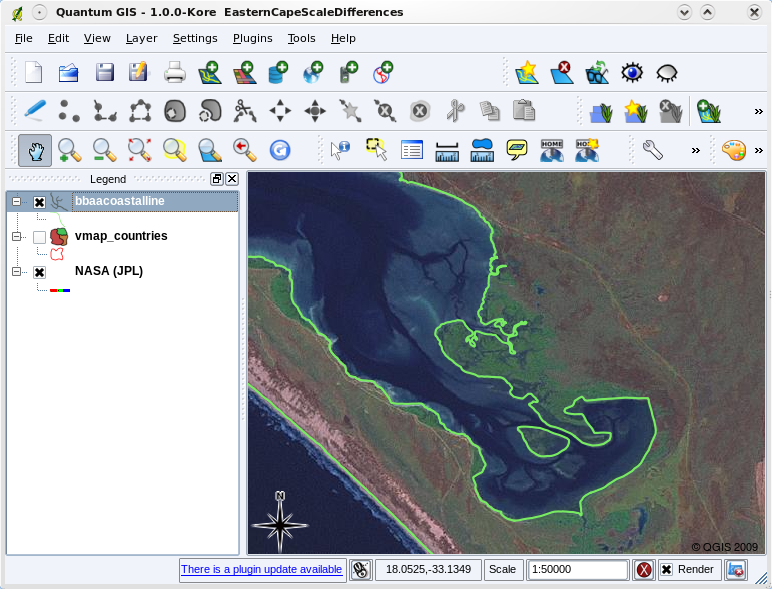



---
## 2.Geopandas

En el modelo vectorial los datos son elementos geométricos básicos como puntos, líneas o polígonos.

Existen muchas librerías de Python que nos permiten trabajar con datos vectoriales: Nosotros trabajaremos con una llamada **Geopandas**.

Geopandas es una extension de la librería Pandas que nos permite trabajar con datos geoespaciales. Para ello toma elementos de otras librerías especialiazadas como **[shapely](https://shapely.readthedocs.io/en/stable/project.html)** para realizar operaciones geométricas, y **[fiona](https://fiona.readthedocs.io/en/latest/manual.html)** para acceder y/o modificar los archivos. Es decir, se trata de un paquete de funcionalidades de alto nivel.

### 2.1. Estructura de datos en Geopandas

Geopandas maneja dos tipos de estructuras de datos: _Geoseries_ y _Geodataframes_.  Estos son subclases de las Series y los Dataframes que maneja Pandas.

Una _Geoseries_ es la estructura elemental en geopandas. Se trata de un vector donde cada una de esas entradas comprende una o más formas o elementos geométricos. Cada uno de estos registros puede constar de una sola geometría (por ejemplo los polígonos de una capa de barrios de una ciudad) o muchas geometrías (por ejemplo, para representar un archipiélago se usan varios polígonos donde cada uno representa una isla):

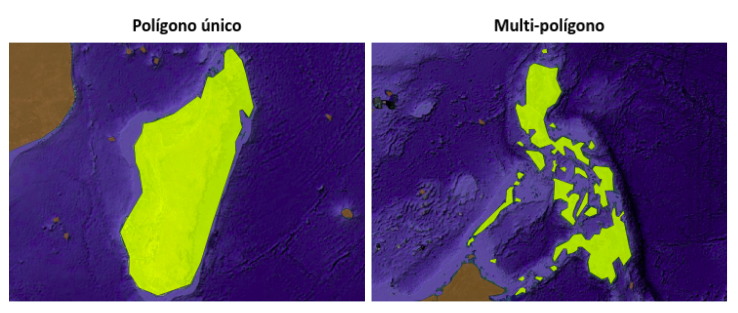

Las _Geoseries_ se pueden manipular como objetos de [Shapely](https://pypi.org/project/Shapely/), lo cual otorga un gran abanico de opciones. Todo el procesamiento geométrico que nos permite GeoPandas descansa sobre las capacidades que le otorga Shapely. 

Los _Geodataframes_ tienen una estructura tabular y contienene una o más _Geoseries_, que representan cada una de las columnas de dicha tabla. Lo importante aquí es entender que dentro de un _Geodataframe_ siempre habrá una columna especial especial sobre la que se pueden hacer las operaciones geométricas. Esta columna normalmente es indicada como la geometría o _geometry_ , aunque su nombre identificatorio no sea exactamente ese:

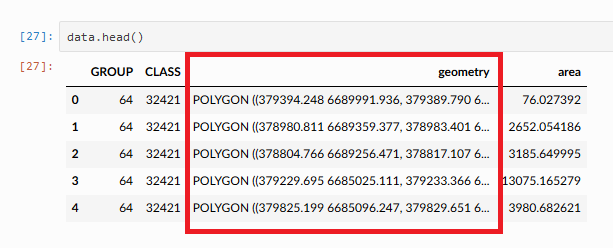

A continuación veremos algunos ejemplos de los principales métodos que podemos usar con un _Geodataframe_. Leeremos con Geopandas el archivo **data/raw_data/vector/radios_recorte_utm.shp** que contiene los radios censales. El método de Geopandas para abrir archivos vectoriales es **[read_file](https://geopandas.org/docs/reference/api/geopandas.read_file.html)**.

In [ ]:
import geopandas as gpd
from matplotlib import pyplot as plt
import numpy as np

radios = gpd.read_file('data/raw_data/vector/radios_recorte_utm.shp')

radios.head(5)

In [ ]:
print(type(radios))

In [ ]:
radios.columns

### 2.2. Atributos y operaciones básicas

Como dijimos mas arriba, sobre la columna especial o de geometría se pueden consultar ciertos atributos. Algunos de los mas comunes son:

- columns: Devuelve el listado de columnas que contiene el GeoDataFrame
- area : Devuelve el área de cada uno de los elementos geométricos
- crs : Devuelve la descripción del Sistema de Coordenadas en que se encuentra el vector
- bounds: Devuelve la extensión (Norte/Sur/Este/Oeste) de cada uno de los elementos geométricos
- total_bounds: Devuelve la extensión total de la capa (algo así como el _extent_ que nos da QGIS)
- geom_type: Nos devuelve el tipo de geometría

In [ ]:
radios.columns

In [ ]:
radios.geom_type

In [ ]:
radios.area

In [ ]:
radios.crs

#### Además de los atributos, también existen métodos como  `plot()` que nos permiten visualizar la capa. `plot` hereda casi todas las propiedades de `matplotlib.pyplot`, con lo cual los parámetros para configurarlo son muy similares.

In [ ]:
radios.plot(figsize = (20,10))
plt.show()

**¿Tiene algo que ver con las imágenes con las que trabajamos en la Clase anterior?** Retomaremos la visualización más adelante, por ahora concentrémosnos en desmenzuar un poco más esta capa vectorial.

Los radios censales son unidades que se definen para relevar el territorio cada vez que se realiza un Censo de Población y Vivienda. En Argentina los responsables de generar la cartografía censal son el INDEC y las Direcciones Provinciales de Estadística. En este [link](https://sitioanterior.indec.gob.ar/codgeo.asp) se pueden descargar las capas vectoriales con radios censales para todo el país. Los radios se agrupan en fracciones censales, que a su vez forman parte de un departamento y una provincia específico.


Cuando hicimos la consulta con _.columns_, encontramos los siguientes atributos dentro de radios:

- ID: Es un identificador único de cada elemento que se genera al importarlo como Geodataframe
- Link: Es la clave censal que permite identificar al radio. En el mismo se especifica la provincia, el departamento, la fracción y el radio censal.
- Totalpobl: El total de personas de ese radio censal
- Area_radio: La superficie del radio censal en m2
- Geometry: La columna de geometría

Supongamos que queremos cambiarles los nombres a estas columnas y ponerles otros con los que estemos más cómodos. La forma más simple de especificarlos es utilizando una estructura diccionario.

In [ ]:
radios.head()

In [ ]:
#Definimos un diccionario para mapear los nombres actuales a nombres nuevos:
nombres_col  = {'link': 'codigo', 'totalpobl': 'personas', 'area_radio': 'sup_m2'}

#Renombramos usando el diccionario anterior:
radios.rename(columns = nombres_col, inplace = True)

radios.head()

¡Bien! Las columnas se renombraron correctamente. Supongamos ahora que queremos crear una columna que tenga el área en hectareas en lugar de m2. Para ello podemos dividir la columna **sup_m2** por 1e4 (diez mil), o dividir por 1e6 la salida del atributo .area: 

In [ ]:
#Opción 1: 

radios['sup_m2'] / 1e4

In [ ]:
#Opción 2:
radios.area / 1e4

#### La forma de crear una nueva columna, es exactamente igual a la de un Datframe de pandas:

In [ ]:
radios['sup_ha'] = radios.area / 1e4
radios.head()

#### Si queremos cambiar el orden de las columnas, podemos generar una lista replicando sus nombres en la secuencia deseada, y redefinir el dataframe con ese orden:

In [ ]:
#Imprimo la lista actual de columnas (esto es solo como ayuda):

list(radios.columns)

In [ ]:
# Defino una lista con el orden nuevo, o incluso con un subconjunto:

cols = ['id', 'codigo', 'personas', 'sup_ha', 'geometry']

In [ ]:
# Redefino el geodataframe con el nuevo orden:
radios = radios[cols]
radios

 **Nota:** En la celda anterior, hemos regenerado el geodataframe con el orden especificado. A no ser que estemos muy seguros del cambio, nos conviene siempre trabajar con copias del elemento original.

Guardamos nuestro Geodataframe modificado como archivo de extensión .SHP, en la misma carpeta **data/proc**:

In [ ]:
import warnings
warnings.filterwarnings("ignore", message="pandas.Int64Index")

radios.to_file('data/proc/radios_ha.shp')

## 3. Visualización de datos en QGIS 

Si lo abrimos en QGIS, podemos corroborar que los atributos reflejan las modificaciones realizadas:

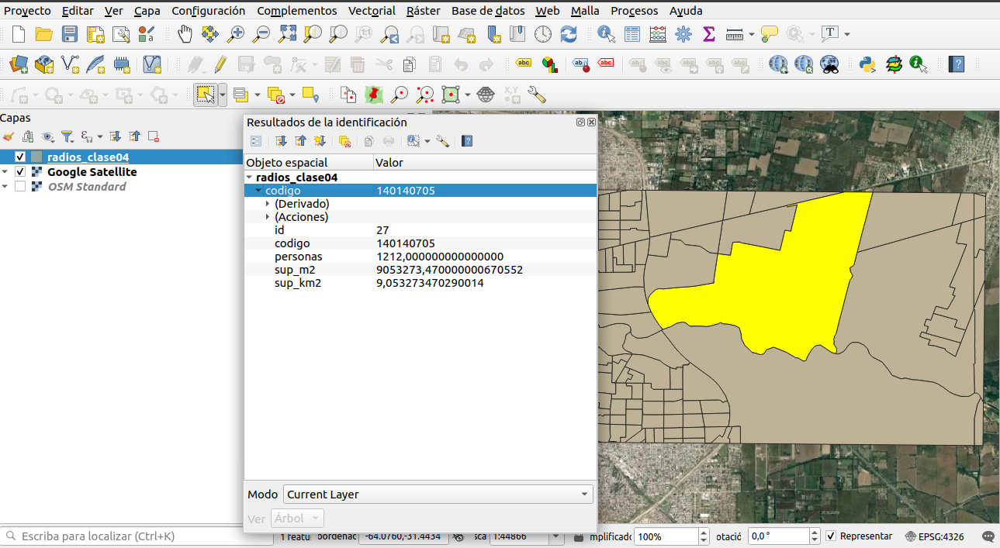

Y en nuestra carpeta se deberán haber generado los ficheros que acompañas normalmente al shape:

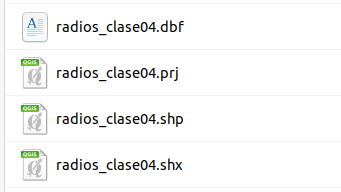

## 4. Formatos de datos vectoriales
#### Una alternativa: El formato GeoPackage

Si bien hasta ahora hemos desarrollado todos nuestros ejemplos con el formato shapefile, que es el más tradicional y difundido dentro de los datos vectoriales, vale este espacio para mencionar a **GeoPackage**.

Geopackage es un formato de archivo que sirve tanto para el formato raster como el vectorial, que almacena la información bajo la estructura de una base datos SQLite. Frente al shapefile, una gran ventaja es que se almacena como un único archivo **.gpkg**, lo cual simplifica mucho las cosas. En los últimos años muchos software de SIG lo vienen incorporando. De hecho, QGIS lo ofrece como el formato de salida por defecto desde su versión 3.X. 

Se puede consultar más información sobre este fomato en el siguiente [enlace](https://mappinggis.com/2017/06/geopackage-para-novatos-uso-en-arcgis-qgis-publicacion-en-geoserver/#Ventajas_de_utilizar_GeoPackage). 

En el ejemplo anterior, en lugar de guardar la capa procesada como shapefile, lo podemos hacer como GeoPackage, y tanto Geopandas como QGIS lo van a reconocer sin problemas:

In [ ]:
radios.to_file('data/proc/radios_ha.gpkg')

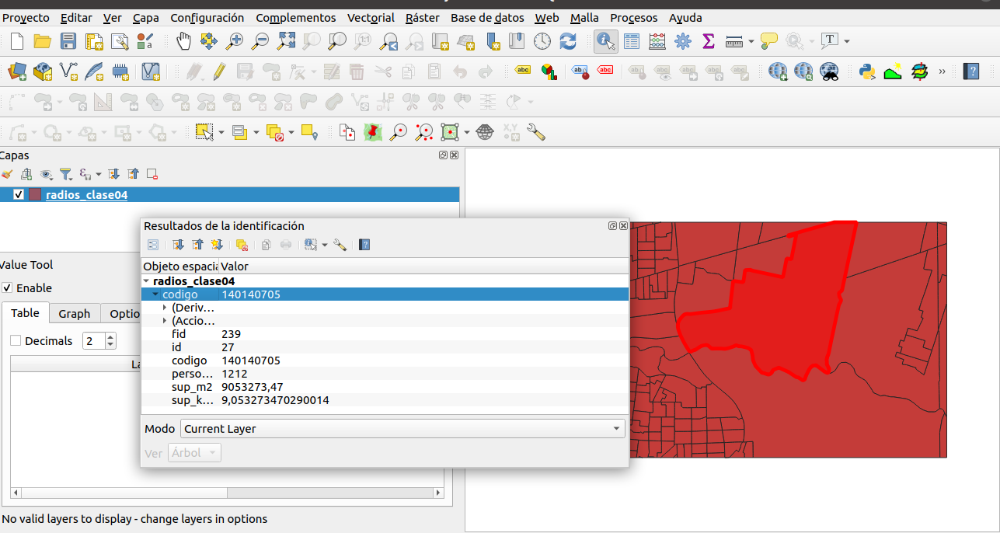

### Ejercicio 5.1:

a) Sobre el Geodataframe de radios, calcular una columna que refleje la densidad de personas por hectarea.

b) Reordenar las columnas para que _geometry_ quede siempre al final (puede re-definir el mismo dataframe).

c) Guardar el Geodataframe modificado como archivo Shapefile y/o como archivo Geopackage y verificar los cambios en QGIS.  

## 5. Joins con tablas externas
### 1.3.  Vinculación con tablas externas

Nuestra tabla de radios censales no tiene mucha más información que la cantidad de personas y su superficie. Es un poco escaso ¿no?

Para subsanar esta falta de información, vamos a importar tablas con datos censales para la provincia de Córdoba, y la vincularemos con nuestra tabla de radios importada como Geodataframe.

Encontraremos las tablas como los archivos **viviendas.csv y personas.csv**. Los mismos fueron elaborados a partir de tablas que se pueden descargar del [sitio](https://datosestadistica.cba.gov.ar/dataset/censo-2010-resultados-definitivos) de la Dirección de Estadísticas y Censos de la Provincia de Córdoba.

Trabajaremos como ejemplo con los datos de **viviendas.csv**, y dejaremos las otras dos tablas para los ejercicios.

In [ ]:
import pandas as pd

viviendas = pd.read_csv('data/raw_data/viviendas.csv')
viviendas.head()

Este dataset de viviendas contiene información sobre la calidad constructiva de las mismas, por radio censal. La columna **1** indica calidad Satisfactoria, la **2** calidad Básica y la **3** indica una calidad de construcción deficiente. Si consultamos el largo de este dataset, veremos que es mucho más grande que nuestra tabla de radios, ya que cubre toda la provincia de Córdoba:

In [ ]:
len(viviendas)

In [ ]:
len(radios)

Necesitamos vincular nuestros Geodataframe de radios con la tabla de viviendas, y eso lo podemos hacer con el comando _merge()_ de Pandas. El Merge realiza una unión entre tablas basándose en un atributo en común, que en este caso es el código de identificación censal.

Además de especificar las columnas a usar para vincular las tablas, debemos también especificar cómo queremos hacer el Merge: **inner, left, right o full**. La siguiente figura ayuda a entender un poco mejor qué significa cada una:

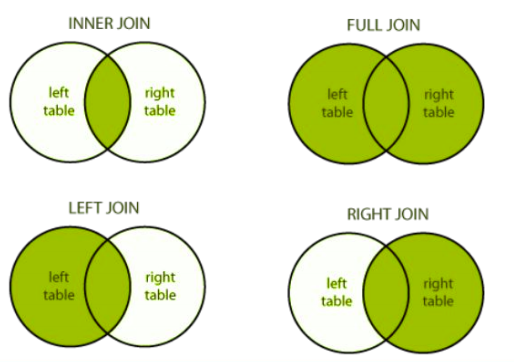

Un inner join solo nos dejaría los elementos para los cuales hay coincidencia entre ambos conjuntos. Left JOIN conserva todos los elementos de la tabla izquierda, y solo aquellos de la segunda tabla que coinciden. ¿Y qué pasa si usamos right JOIN?

Obviamente, el uso de estos parámetros variará según en qué orden pongamos nuestras tablas (¿quién va a la derecha y a la izquierda respectivamente?). Veámoslo con el código:

In [ ]:
radios_merge = radios.merge(viviendas, how = 'left', left_on = 'codigo', right_on = 'codigo')
radios_merge.head()

En la celda anterior, en **how** especificamos cómo queremos hacer el Merge, **left_on** indica 'el campo de la tabla de radios que usamos para vincular (es nuestra tabla "izquierda" en este caso), y con **right_on** indicamos cómo se llama la columnas en Viviendas (nuestra tabla "derecha"), que en este caso tiene el mismo nombre que en radios.

Corroboramos que ahora tenemos todos los campos agrupados en nuestro nuevo Geodataframe:

In [ ]:
radios_merge.columns

¡Perfecto! Hemos logrado unir datos provenientes de dos tablas distintas. Ahora que tenemos más información, probaremos hacer algunos ploteos con algo más de color, guiándonos por las referencias que ofrece este [tutorial de geopandas sobre mapeo](https://geopandas.org/docs/user_guide/mapping.html).

Probemos por ejemplo colorear los radios censales según la cantidad de viviendas tipo 3 (calidad constructiva insuficiente) que tiene cada uno:

In [ ]:
radios_merge.plot(column = '3' , figsize = (12,6))
plt.show()

Quizá mostrando porcentajes en relación al total de viviendas, sea más representativo que cantidades absolutas. Tal como ya aprendimos, podemos calcular una columna con este porcentaje:

In [ ]:
#Cambiar nombre de columna a algo más representativo (que no supere 10 caracteres)

radios_merge['porc_viv_3'] = (radios_merge['3'] / radios_merge['total'])*100

radios_merge.plot(column = 'porc_viv_3' , figsize = (12,6))
plt.show()

Se puede seguir jugando con distintos parámetros que ofrece el método plot, especificando elementos como la leyenda, el título, el mapa de colores, el nivel de transparencia, etc. Se sugiere revisar la documentación de Geopandas para encontrar más opciones.

In [ ]:
radios_merge.plot(column = 'porc_viv_3' , figsize = (20,10), legend = True, legend_kwds = {'label': "%",
   ....:                         'orientation': "vertical"}, cmap = 'OrRd', alpha = 0.75)
plt.title('Porcentaje de viviendas con calidad constructiva insuficiente - por Radio Censal')
plt.show()

### Ejercicio 5.2:

a) Ordenar las columnas de radios_merge para que _geometry_ quede al final (pueden re-definir el dataset, o crear uno nuevo).

b) Renombrar la columna **total** como **total_v** para identificar que se trata de viviendas. **Nota**: Podés crear una nueva columna que sea una copia de **total**, o probar el método [rename](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.rename.html) de Pandas.

c) Guardar el Geodataframe con todas las transformaciones realizadas, como **data/out/radios_merge_viv.shp** (o alternativamente, con extensión .gpkg) y corroborar en QGIS que se hayan impactado los cambios.

### Ejercicio 5.3:

a) Importar la tabla **personas.csv** de la carpeta data/raw_data, y vincularla con el Geodataframe **radios_merge** (que ya tiene incorporados los datos de **viviendas.csv**) a través del comando Merge (verificar el tipo de dato de las columnas antes de unir!).  

b) Descartar todas las columnas repetidas como consecuencia del merge anterior (sobre todo las columnas 'prov', 'dpto', 'frac', 'rad', debe quedar una sola), y dejar solamente las columnas **varon** y **mujer** , que contienen la cantidad de mujeres y varones respectivamente. Las columnas finales deberían ser similares a la siguiente lista:

``` ['id', 'codigo','prov', 'dpto', 'frac','rad', 'personas', 'varon', 'mujer', 'sup_ha', '1', '2', '3', 'porc_3', 'total_v','geometry'] ```  

**Nota:** Una forma de "descartar" es redefinir el dataframe como lo hicimos anteriormente, otra para eliminar explícitamente una columna es usar el método **.drop** de Pandas. Probalos y usá el método con el que te sientas más cómodx.

c) Guardar el geodataframe final como **data/out/radios_merge_viv_personas.shp** (o alternativamente, con extensión .gpkg) . De acuerdo a las transformaciones realizadas la tabla debería verse similar a esta imagen:

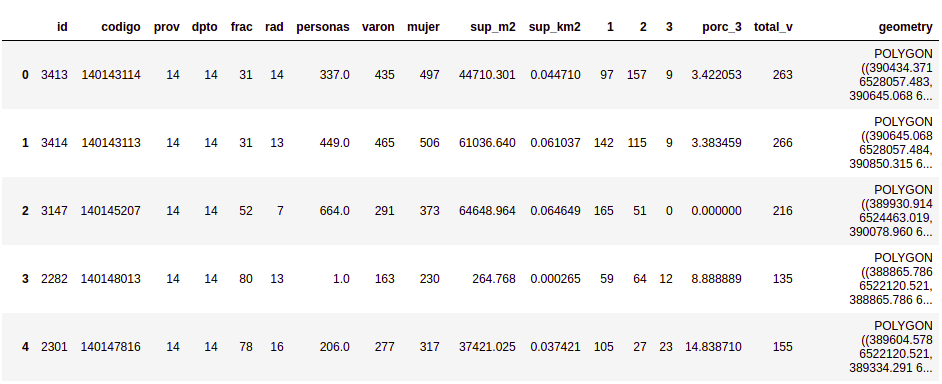
